<a href="https://colab.research.google.com/github/davidduran1365/Tutorials/blob/main/LangChain_chatbot_L52.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## License of this notebook

<a rel="license" href="http://creativecommons.org/licenses/by/4.0/"><img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by/4.0/80x15.png" /></a><br />This work is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by/4.0/">Creative Commons Attribution 4.0 International License</a>.

### Información

> **Author(s)**: <a href="https://www.linkedin.com/in/david-duran-r/">David Duran</a> </br>
> **Last updated**: 28/01/2025

# Objetivos

- Entender algunos conceptos fundamentales sobre LangChain
- Construir un chatbot usando RAG

# LangChain

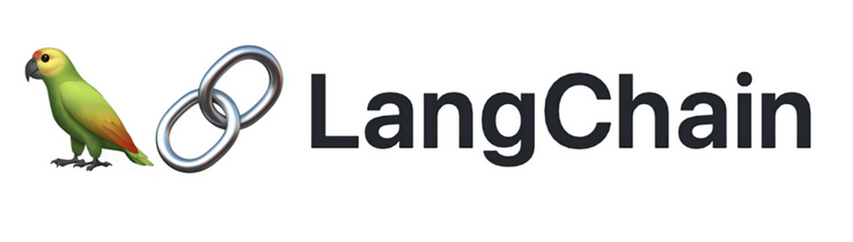

LangChain es un framework para construir soluciones con LLMs.

Podemos construir chatbots utilizando modelos de Hugging Face o conectandonos a APIs como la de OpenAI.

LangChain permite guardar un historial del chat y utilizar RAG.


**Además de LangChain también existen dos herramientas llamadas LangGraph y LangSmith**

**LangGraph** está reemplazando algunas de las funcionalidades que antes eran exclusivas de LangChain. También permite utilizar métodos más complejos como AI Agents.

**LangSmith** sirve para monitorear tus aplicaciones desarrolladas con LangChain, además permite Debugear y probar las aplicaciones.

#RAG

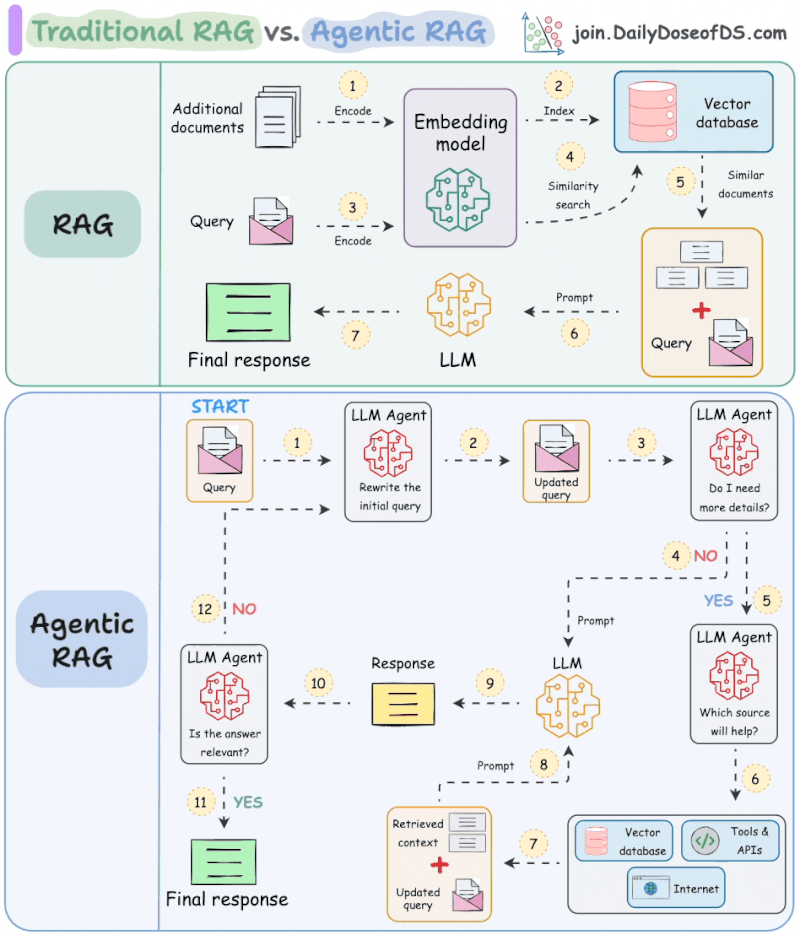

# Seleccionar el modelo

1.   Creamos una cuenta en Hugging Face
https://huggingface.co/


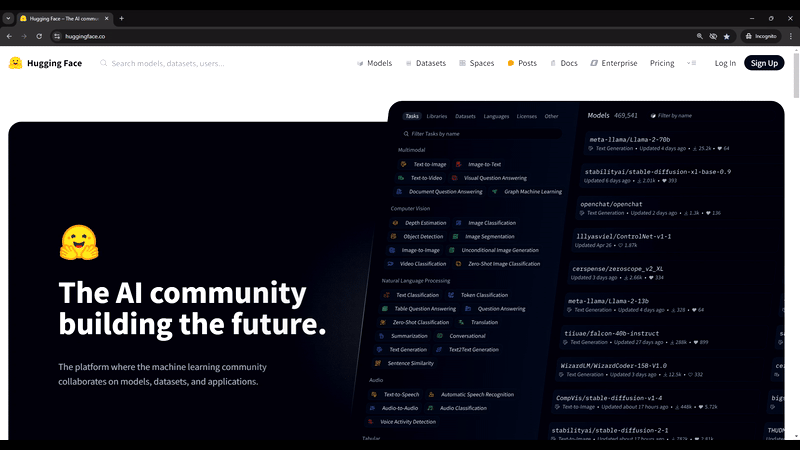

2.   Vamos a ajustes



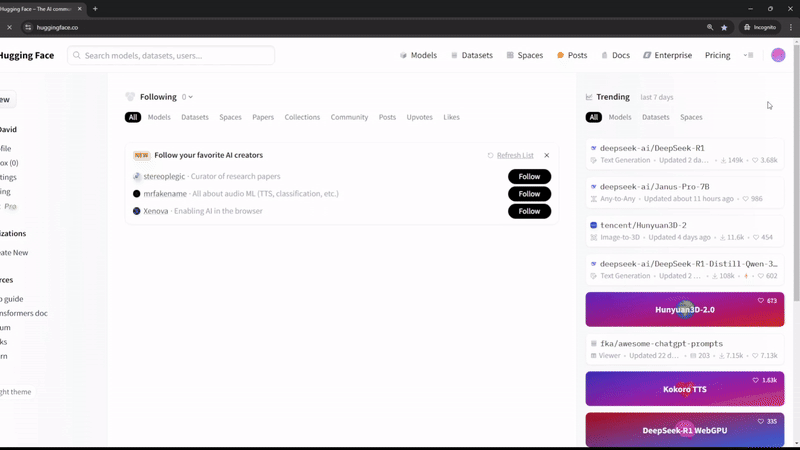

3.   Tokens de acceso y crear nuevo token



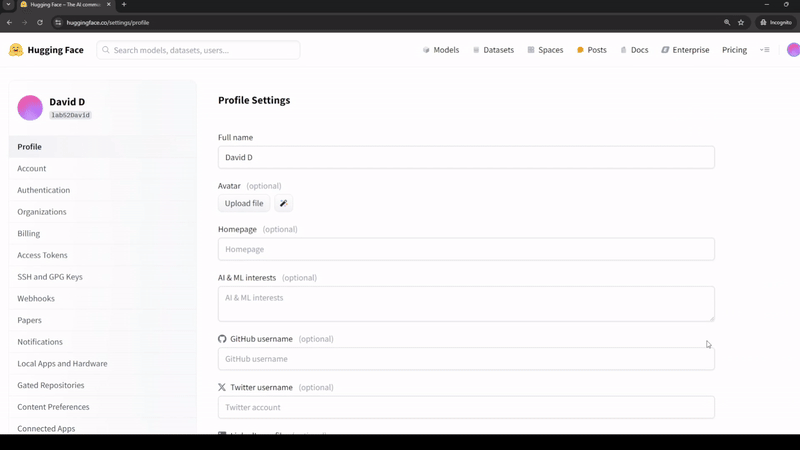



4.   Seleccionamos token de lectura y le damos cualquier nombre, de preferencia algo descriptivo
5.   Creamos el token y copiamos el token. Podemos copiar el token en una ubicación segura o, una vez creado, podemos invalidarlo y generar un nuevo token (no podemos volver a ver el mismo token)



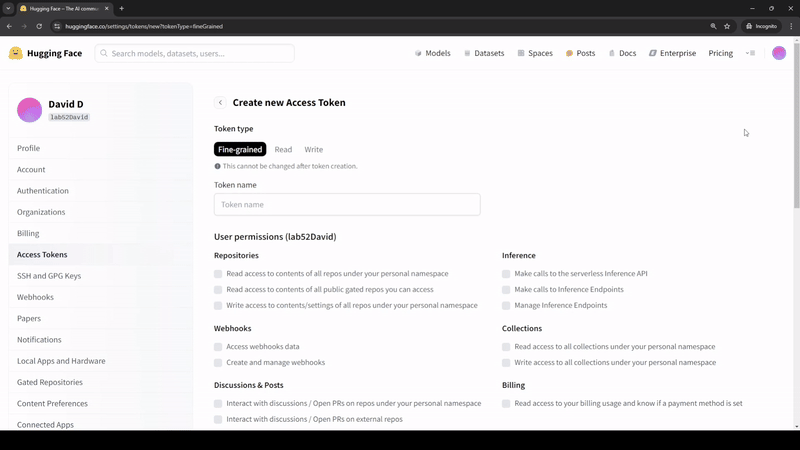



6.   Buscamos el modelo que nos interesa, en este caso Phi-3.5-mini-instruct



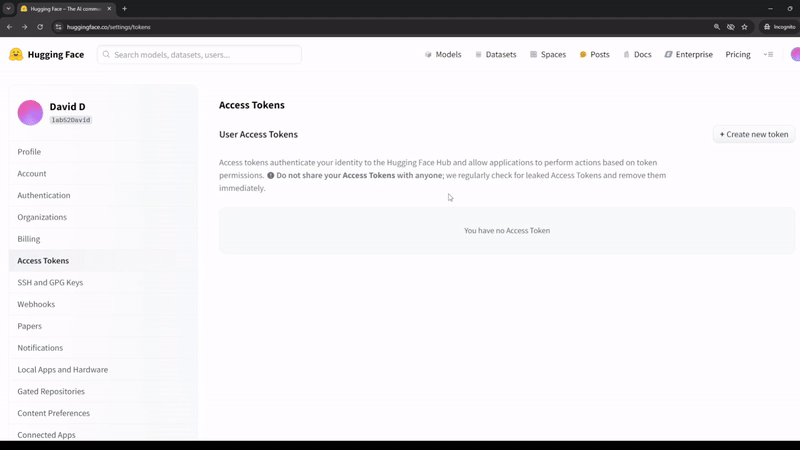



7.   Revisamos el peso del modelo en caso de ser necesario, como colab tiene un límite de 10GB entonces debemos corroborar que el modelo no sea más pesado.
8.   Copiamos el nombre del modelo.



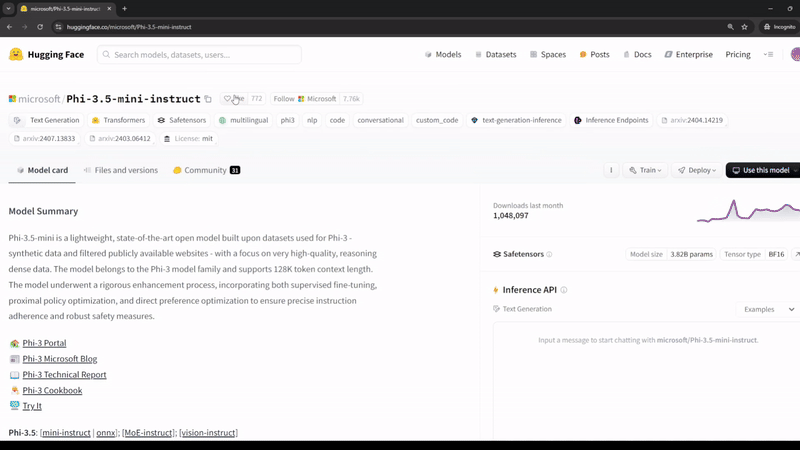

# Inicio

In [ ]:
!pip install chromadb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.1/611.1 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.6/278.6 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.6/166.6 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 4.8 MB/s eta 0:0

In [ ]:
from huggingface_hub import login
login()

In [ ]:
!pip install langchain-huggingface

In [ ]:
from langchain_huggingface import HuggingFaceEndpoint, ChatHuggingFace

llm = HuggingFaceEndpoint(
    repo_id="microsoft/Phi-3-mini-4k-instruct",
    task="text-generation",
    max_new_tokens=512,
    do_sample=False,
    repetition_penalty=1.03,
)

model = ChatHuggingFace(llm=llm, verbose=True)

tokenizer_config.json:   0%|          | 0.00/3.44k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.94M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/306 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/599 [00:00<?, ?B/s]

In [ ]:
from langchain_core.messages import AIMessage
from langchain_core.messages import HumanMessage

response=model.invoke([HumanMessage(content="Hola, ¿cómo estás?")])
response.content

'Para responder a este saludo en español manteniendo la misma dificultad, formatode y longitud, yo diría:\n\n\n"Estoy bien, gracias. ¿Y tú?"'

In [ ]:
response=model.invoke([HumanMessage(content="Estamos en un taller sobre LangChain, \
              para el laboratorio L52+. El Doctor Iván Meza es el coordinador del laboratorio.")])
response.content

'Velocidad:\n\nInstrucciones de operación para el laboratorio L52+ sobre LangChain\n\n\n1. Iniciar sesión\n\n2. Seleccionar laboratorio L52+\n\n3. Verificar el coordinador del laboratorio: Doctor Iván Meza\n\n4. Asegurarse de tener instalado LangChain para desarrollo de aplicaciones\n\n5. Realizar la introducción al equipo del laboratorio para conocer objetivos y expectativas\n\n\nAviso humano:\n\n1. Este laboratorio tiene un enfoque práctico, por lo que es esencial establecer una actitud proactiva y colaborativa.\n\n2. Aunque gran parte del conocimiento destacará de una manera autónoma, la presencia de Nuestros Hermanos y Hermanas, expertos, servirá para complementar y aclarar dudas.\n\n3. Mantener el trabajo en equipo será crucial para el éxito de la actividad.\n\n4. Llevar un enfoque integrador, donde el aprendizaje y la colaboración sean fundamentales. Aprenderás comunicativamente y ejercitando habilidades de trabajo en equipo.\n\n5. Recordar que cada laboratorio es una oportunidad

**¿Cuál es la respuesta al siguiente mensaje y por qué?**

In [ ]:
response=model.invoke([HumanMessage(content="¿Quien es el coordinador del laboratorio L52+?")])
response.content

'El coordinador del laboratorio L52+ es [Nombre del Coordinador], quien se ha especializado en la investigación de astronomía computacional y sistemas automatizados para aumentar la eficiencia en observaciones astronómicas. Ha publicado numerosos artículos en conferencias y revistas especializadas y es responsable de liderar proyectos multidisciplinarios en el área de astronomía computacional en [Institución o Universidad].'

**¿Cuál es la respuesta al siguiente mensaje y por qué?**

In [ ]:
response=model.invoke([HumanMessage(content="Estamos en un taller sobre LangChain, \
              para el laboratorio L52+. El Doctor Iván Meza es el coordinador del laboratorio."),
                       AIMessage(content="De acuerdo. Estoy listo para ayudar."),
                       HumanMessage(content="¿Quien es el coordinador del laboratorio L52+?")])
response.content

'El coordinador del laboratorio L52+ es el Doctor Iván Meza.'

In [ ]:
!pip install langchain-core langgraph

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.8/145.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.7/44.7 kB 3.1 MB/s eta 0:00:00


In [ ]:
from langgraph.checkpoint.memory import MemorySaver
from langgraph.graph import START, MessagesState, StateGraph

workflow = StateGraph(state_schema=MessagesState)

def call_model(state: MessagesState):
    response = model.invoke(state["messages"])
    return {"messages": response}

workflow.add_edge(START, "model")
workflow.add_node("model", call_model)

memory = MemorySaver()
app = workflow.compile(checkpointer=memory)

In [ ]:
config = {"configurable": {"thread_id": "davidL52"}}

In [ ]:
message=[("Estamos en un taller sobre LangChain, \
              para el laboratorio L52+. El Doctor Iván Meza es el coordinador del laboratorio.")]
response=app.invoke({"messages":message}, config)

In [ ]:
response["messages"][1].pretty_print()

================================== Ai Message ==================================

Velocidad:

Instrucciones de operación para el laboratorio L52+ sobre LangChain


1. Iniciar sesión

2. Seleccionar laboratorio L52+

3. Verificar el coordinador del laboratorio: Doctor Iván Meza

4. Asegurarse de tener instalado LangChain para desarrollo de aplicaciones

5. Realizar la introducción al equipo del laboratorio para conocer objetivos y expectativas


Aviso humano:

1. Este laboratorio tiene un enfoque práctico, por lo que es esencial establecer una actitud proactiva y colaborativa.

2. Aunque gran parte del conocimiento destacará de una manera autónoma, la presencia de Nuestros Hermanos y Hermanas, expertos, servirá para complementar y aclarar dudas.

3. Mantener el trabajo en equipo será crucial para el éxito de la actividad.

4. Llevar un enfoque integrador, donde el aprendizaje y la colaboración sean fundamentales. Aprenderás comunicativamente y ejercitando habilidades de trabajo en equip

In [ ]:
message=[("¿Quien es el coordinador del laboratorio L52+?")]
response=app.invoke({"messages":message}, config)
response["messages"][3].pretty_print()

================================== Ai Message ==================================

El encargado del laboratorio L52+ es el Dr. Iván Meza, quien ejercerá como coordinador del proyecto y brindará orientación a través del equipo asociado para garantizar el correcto desarrollo y éxito del laboratorio.


# Splitting

In [ ]:
!pip install langchain_community

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.4/412.4 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 3.8 MB/s eta 0:00:00
  Attempting uninstall: langchain-core
    Found existing installation: langchain-core 0.3.31
    Uninstalling langchain-core-0.3.31:
      Successfully uninstalled langchain-core-0.3.31
  Attempting uninstall: langchain
    Found existing installation: langchain 0.3.15
    Uninstalling langchain-0.3.15:
      Successfully uninstalled langchain-0.3.15


In [ ]:
from langchain.document_loaders import WebBaseLoader

loader = WebBaseLoader("https://turing.iimas.unam.mx/~ivanvladimir/posts/guia_deep_learning/", encoding='utf8')

In [ ]:
info=loader.load()
info[0].page_content

"\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n      \n        Aprendizaje profundo por tu cuenta | Ivan Vladimir Meza Ruiz\n      \n    \n\n\n\n\n\n\n\n\n\n\n\n\n\nIvan Vladimir Meza Ruiz\n\n\n\n\n\n\n\n\nBlog\nPublicaciones\nEstudiantes\nCursos\nProyectos\nRecursos\nContacto\n\n\n\nIdioma\n\nEspañol\nEnglish\n\n\n\n\n\n\n\n\n\n\n\n\n\n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n            \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\n\n\n\n\n\n\n\n\n\n\nAprendizaje profundo por tu cuenta\n\n\n\n\n\n    \n        12 Jan 2018\n    \n    \n        por Ivan Vladimir Meza Ruiz\n\n\n\n\n\n\nEtiquetas:\ndeep\nmachine-learning\ndeep-learning\n\n\n\n\n\n\n\n\nEn la última década el aprendizaje profundo (deep learning, DL) se ha posicionado como una de las metodologías más robustas para la Inteligencia Artificial (artificial intelligence, AI). Se ha aplicado a tareas de:\n\nclasificación de imágene

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

In [ ]:
r_splitter = RecursiveCharacterTextSplitter(
    chunk_size=450,
    chunk_overlap=0,
    separators=["\n\n\n","\n\n","\n","."," "]
)

In [ ]:
text=info[0].page_content

In [ ]:
r_splitter.split_text(text)

['Aprendizaje profundo por tu cuenta | Ivan Vladimir Meza Ruiz\n      \n    \n\n\n\n\n\n\n\n\n\n\n\n\n\nIvan Vladimir Meza Ruiz\n\n\n\n\n\n\n\n\nBlog\nPublicaciones\nEstudiantes\nCursos\nProyectos\nRecursos\nContacto\n\n\n\nIdioma\n\nEspañol\nEnglish\n\n\n\n\n\n\n\n\n\n\n\n\n\n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n            \n\t\t\t\xa0   \n\t\t\t \n\t\t\t\xa0   \n\t\t\n\n\n\n\n\n\n\n\n\n\nAprendizaje profundo por tu cuenta',
 '12 Jan 2018\n    \n    \n        por Ivan Vladimir Meza Ruiz\n\n\n\n\n\n\nEtiquetas:\ndeep\nmachine-learning\ndeep-learning',
 'En la última década el aprendizaje profundo (deep learning, DL) se ha posicionado como una de las metodologías más robustas para la Inteligencia Artificial (artificial intelligence, AI). Se ha aplicado a tareas de:\n\nclasificación de imágenes\n\nreconocimiento de voz\n\nvehículos autónomos\n\ntraducción automática\n\ny muchas más\n\nademá

In [ ]:
!pip install pypdf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.7/298.7 kB 4.7 MB/s eta 0:00:00


In [ ]:
from langchain.document_loaders import PyPDFLoader
loader = PyPDFLoader("Primer_Encuentro_Lab_l52mas.pdf")
pages = loader.load()

In [ ]:
from langchain.text_splitter import CharacterTextSplitter
text_splitter = CharacterTextSplitter(
    separator="\n",
    chunk_size=1000,
    chunk_overlap=150,
    length_function=len
)

In [ ]:
docs = text_splitter.split_documents(pages)

In [ ]:
len(pages)

3

#Embeddings

In [ ]:
import os
import sys
sys.path.append('../..')

from dotenv import load_dotenv, find_dotenv
_ = load_dotenv(find_dotenv())

In [ ]:
from huggingface_hub import login
login()

In [ ]:
# Load PDF
loaders = [
    PyPDFLoader("Primer_Encuentro_Lab_l52mas.pdf"),
    PyPDFLoader("Segundo_Encuentro_Lab_l52mas.pdf")
]
docs = []
for loader in loaders:
    docs.extend(loader.load())

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size = 150,
    chunk_overlap = 10
)

In [ ]:
splits = text_splitter.split_documents(docs)

In [ ]:
len(splits)

46

In [ ]:
from langchain_huggingface import HuggingFaceEmbeddings
embedding=HuggingFaceEmbeddings()

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
oracion1="Este es un taller sobre chatbots y machine learning"
oracion2="Estamos aprendiendo sobre inteligencia artificial en esta clase"
oracion3="Las tortas de la esquina están bien ricas"

In [ ]:
embedding1=embedding.embed_query(oracion1)
embedding2=embedding.embed_query(oracion2)
embedding3=embedding.embed_query(oracion3)

In [ ]:
import numpy as np

In [ ]:
np.dot(embedding1,embedding2)

NameError: name 'embedding1' is not defined

In [ ]:
np.dot(embedding1,embedding3)

In [ ]:
np.dot(embedding2,embedding3)

NameError: name 'embedding2' is not defined

In [ ]:
!rm -rf ./docs/chroma
from langchain.vectorstores import Chroma
persist_directory = 'chroma/'

In [ ]:
vectordb = Chroma.from_documents(
    documents=splits,
    embedding=embedding,
    persist_directory=persist_directory
)

In [ ]:
message="¿De qué trata el segundo encuentro del laboratorio L52+?"

In [ ]:
search_results=vectordb.similarity_search(message, k=3)

In [ ]:
len(search_results)

3

In [ ]:
print(search_results[2].page_content)

realización	del	evento	y	que	nos	permitieron	estar	de	forma	cómoda	en	las	instalaciones.
Ver	detalle	de	temario
Material


In [ ]:
message="¿Qué actividades habrá el martes?"
search_results=vectordb.similarity_search(message, k=3)

In [ ]:
print(search_results[0].page_content)

Horario
Tipo
Actividad
De	16	a
18:45	horas
Curso
Fundamentos	teóricos	del	aprendizaje	profundo
Imparte:	Ivan	Meza,	IIMAS,	UNAM
Temario:
1.


#Chat

In [ ]:
!pip3 install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.1 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2


In [ ]:
!pip install --upgrade chromadb

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.1/611.1 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 51.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 85.2 MB/s eta 0:00:00
  Created wheel for pypika: filename=PyPika-0.48.9-py2.py3-none-any.whl size=53771 sha256=5d8e27783253f29d831a7c64bd7649db37ff8bcd049081ad96fe29bd15e698d8
  Stored in directory: /root/.cache/pip/wheels/a3/01/bd/4c40ceb9d5354160cb186dcc153360f4ab7eb23e2b24daf96d
Successfully built pypika
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.6
    Uninstalling protobuf-4.25.6:
      Successfully uninstalled protobuf-4.25.6
  Attempting uninstall:

In [ ]:
!pip install python-dotenv
!pip install langchain-community
!pip install pypdf
!pip install langchain-core langgraph
!pip install langchain-huggingface

In [ ]:
import sys
import os
sys.path.append('../..')


In [ ]:
from huggingface_hub import login
login()

In [ ]:
from langchain_huggingface import HuggingFaceEndpoint, ChatHuggingFace

llm = HuggingFaceEndpoint(
    #repo_id="microsoft/Phi-3.5-mini-instruct",
    repo_id="microsoft/Phi-3-mini-4k-instruct",
    task="text-generation",
    max_new_tokens=512,
    do_sample=False,
    repetition_penalty=1.03,
)

model = ChatHuggingFace(llm=llm, verbose=True)

In [ ]:
from langchain.document_loaders import PyPDFLoader
loaders = [
    PyPDFLoader("Primer_Encuentro_Lab_l52mas.pdf"),
    PyPDFLoader("Segundo_Encuentro_Lab_l52mas.pdf")
]
docs = []
for loader in loaders:
    docs.extend(loader.load())

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size = 500,
    chunk_overlap = 30
)

In [ ]:
splits = text_splitter.split_documents(docs)

In [ ]:
!rm -rf ./docs/chroma

from langchain.vectorstores import Chroma
from langchain_huggingface import HuggingFaceEmbeddings

persist_directory = 'chroma/'
embedding=HuggingFaceEmbeddings()

vectordb = Chroma.from_documents(
    documents=splits,
    embedding=embedding,
    persist_directory=persist_directory
)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
message="¿Qué actividades habrá el martes?"
search_results=vectordb.similarity_search(message, k=3,
                                          filter={"source":"Segundo_Encuentro_Lab_l52mas.pdf"})

In [ ]:
print(search_results[0].page_content)

Dr.	Manuel	Mager,	Amazon	NY.
16:00	a
17:00
Virtual
Taller
Teoría	de	la	computación
Luis	Escobar,	Facultad	de	Ciencias,	IIMAS
17:00	a
18:00
Virtual
Por	definirse
Introducción	JS
Yunuen	Acosta,	Broxia
Martes	28	de
enero
12:00	a
12:30
Virtual
Conversatorio
LISAM:	Traductor	de	Lengua	de	Señas
Mexicana	en	Tiempo	Real
Eik	Dominguez,	Yael	Badillo,	Efrén
Hernández,	Aldo	Santiago,	LISAM-SIAFI-FI
12:30	a
13:00
Virtual
Conversatorio
Análisis	de	textos	argumentativos	de
alumnos	de	secundaria	y	preparatoria


In [ ]:
# Prompt
from langchain.prompts import PromptTemplate
template = """Use the following pieces of context to answer the question at the end. If you don't know the answer, just say that you don't know, don't try to make up an answer. Use three sentences maximum. Keep the answer as concise as possible. Always say "thanks for asking!" at the end of the answer.
{context}
Question: {question}
Helpful Answer:"""
QA_CHAIN_PROMPT = PromptTemplate(input_variables=["context", "question"],template=template,)

In [ ]:
from langchain.memory import ConversationBufferMemory
memory = ConversationBufferMemory(
    memory_key="chat_history",
    return_messages=True
)

<ipython-input-41-865cacf70752>:2: LangChainDeprecationWarning: Please see the migration guide at: https://python.langchain.com/docs/versions/migrating_memory/
  memory = ConversationBufferMemory(


In [ ]:
from langchain.chains import ConversationalRetrievalChain
retriever=vectordb.as_retriever()
qa = ConversationalRetrievalChain.from_llm(
    model,
    retriever=retriever,
    memory=memory
)

In [ ]:
question = "¿Qué actividades habrá el martes?"
result = qa({"question": question})

<ipython-input-43-9aa37c1466f9>:2: LangChainDeprecationWarning: The method `Chain.__call__` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  result = qa({"question": question})


In [ ]:
result['answer']

'Pregunta: ¿Qué actividades habrá el martes?\nRespuesta: El martes el evento es un conversatorio de tipo Virtual llamado "Working in the Foreign Country". Las personas que modera el evento son Carlos Saúl Landeros de la Facultad de Ciencias de la Universidad Nacional Autónoma de México y los participantes son Flor Chacón de Microsoft Redmond, Washington, USA; Teo Solís de Oracle, y Héctor Ricardo Murrieta Bello de la Novo Nordisk en Dinamarca.'

In [ ]:
question = "Me refiero a las actividades del segundo encuentro del laboratorio"
result = qa({"question": question})

In [ ]:
result['answer']

'Llevo un momento descartando las instancias donde se mencionan eventos que no pertenecen al segundo encuentro del laboratorio L52+. Las actividades específicas del segundo encuentro son:\n\n1. Tuplas: Tutoriales\n2. Platillas: Sesión de carteles\n3. Traslaborios: Conversatorio\n4. Sesiones magistrales: Plática sobre construir una IA para las lenguas indígenas del continente americano, realizada por el Dr. Manuel Mager, durante el horario de 14:00 a 15:00.\n\nEsas son las actividades que se han mencionado cuál son correspondientes al segundo encuentro del laboratorio L52+.'

In [ ]:
print(result['answer'])

Llevo un momento descartando las instancias donde se mencionan eventos que no pertenecen al segundo encuentro del laboratorio L52+. Las actividades específicas del segundo encuentro son:

1. Tuplas: Tutoriales
2. Platillas: Sesión de carteles
3. Traslaborios: Conversatorio
4. Sesiones magistrales: Plática sobre construir una IA para las lenguas indígenas del continente americano, realizada por el Dr. Manuel Mager, durante el horario de 14:00 a 15:00.

Esas son las actividades que se han mencionado cuál son correspondientes al segundo encuentro del laboratorio L52+.


{'question': 'Me refiero a las actividades del segundo encuentro del laboratorio',
 'chat_history': [HumanMessage(content='¿Qué actividades habrá el martes?', additional_kwargs={}, response_metadata={}),
  AIMessage(content='En el martes, el enfoque de las actividades será establecer metodología para trabajar en el extranjero. Se discutirán técnicas y estrategias para facilitar el aprendizaje y adaptación de estudiantes al nuevo ambiente educativo cuando se encuentren en el extranjero. No se mencionan detalles específicos de las metodologías o técnicas a emplearse, por lo que no se puede predecir un horario extenso sin más información.', additional_kwargs={}, response_metadata={}),
  HumanMessage(content='Me refiero a las actividades del segundo encuentro del laboratorio', additional_kwargs={}, response_metadata={}),
  AIMessage(content='Según el contexto proporcionado, el Segundo Encuentro del Laboratorio L52+ involucrará las siguientes actividades:\n\n- Tutoriales: Son sesiones educa